# Introduction to Spatially-resolved Transcriptomics with 10X Xenium



---


Author: Elyas Heidari, `elyas.heidari@dkfz-heidelberg.de`

Date: 29.02.2024

Google colab link: http://tinyurl.com/3whp6xz4


---


## Introduction

[Xenium technology](https://www.10xgenomics.com/platforms/xenium) is the current (Feb. 2024) holy grail of imaging-based multiplexed spatial transcriptomics (spatial tx), it's sensitive, high quality, standardised, widely-used, etc. We are gonna touch on the following topics:

<!-- [Visium](https://www.10xgenomics.com/products/spatial-gene-expression), on the other hand, is the most abaundant one, it's barcode-based (spots, super-cellular), (relatively) cheap and easy to carry out.

The analysis workflows for both are quite established, but there are still some moving parts: -->

* How to carry out mutli-sample multi-condition analysis.
* How to define cellular niches.
* How to infer cell-cell communications.
<!-- * How to deconvlove spots (Visium). -->
* How to segment cells (Xenium).
* What else?!

Read more here:

* [Museum of spatial transcriptomics](https://pachterlab.github.io/LP_2021/index.html)
* [Spatial biology of cancer evolution](https://pubmed.ncbi.nlm.nih.gov/36494509/)
* [Spatial components of molecular tissue biology](https://pubmed.ncbi.nlm.nih.gov/35132261/)
* [Methods and applications for single-cell and spatial multi-omics](https://www.nature.com/articles/s41576-023-00580-2)
* [Xenium paper](https://www.nature.com/articles/s41467-023-43458-x)


## The breast cancer dataset
In this workshop we are gonna work with [a breast cancer dataset](https://www.10xgenomics.com/products/xenium-in-situ/human-breast-dataset-explorer). Our approach is to treat this dataset as a single-cell (RNAseq) dataset and then aim to leverage the spatial information.

## Setup
We are gonna use python-based tools:
* [Anndata](https://anndata.readthedocs.io/en/latest/index.html) as the data container
* [Scanpy](https://scanpy.readthedocs.io/en/stable/index.html) when we treat spatial tx as scRNAseq.
* [Squidpy](https://squidpy.readthedocs.io/en/stable/) for exploratory tools specefic for spatial omics.
* What else?!


### Download data
The following datasets are created by [simple readers](https://squidpy.readthedocs.io/en/stable/api.html#module-squidpy.read) adopted from squidpy to produce Anndata objects from raw file out of the 10X machines. Raw files could be found [here](https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast). We also use [an external breast cancer scRNAseq dataset](https://www.nature.com/articles/s41588-021-00911-1)for some magic down the road!

In [ ]:
!wget https://www.huber.embl.de/users/harald/embo/xenium_rep1.h5ad
# !wget https://www.huber.embl.de/users/harald/embo/xe_rep2.h5ad
!wget https://www.huber.embl.de/users/harald/embo/visium_adata.h5ad
!wget https://www.huber.embl.de/users/harald/embo/BC_atlas_xe.h5ad
!wget https://www.huber.embl.de/users/harald/embo/scFFPE_raw.h5ad

### Required packages

In [ ]:
!pip install scanpy
!pip install squidpy
!pip install leidenalg

In [4]:
import pandas as pd
import xlrd
from pathlib import Path
import json
from collections import namedtuple, Counter

import numpy as np
import scanpy as sc
import squidpy as sq
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.spatial import KDTree

from matplotlib import rcParams
FIGSIZE=(10,10)
rcParams['figure.figsize']=FIGSIZE

# sc.settings.verbosity = 0
# sc._settings.ScanpyConfig.verbosity = 0

import warnings
warnings.filterwarnings("ignore")

In [5]:
xe_rep1  = sc.read('xenium_rep1.h5ad') # Xenium dataset
sc.pp.subsample(xe_rep1, 0.1) # for computational reasons (!) we subset the Xenium dataset to only 10% of the data.
visium   = sc.read('visium_adata.h5ad') # paired Visium dataset
xe_atlas = sc.read('BC_atlas_xe.h5ad') # independent scRNAseq breast cancer atlas


## Spatial transcriptomics from the lens of single cells

### Good old UMAPs!

Let's first look at the scRNAseq atlas. One can appreciate clearly separated clusters of cells in the UMAP.

         Falling back to preprocessing with `sc.pp.pca` and default params.


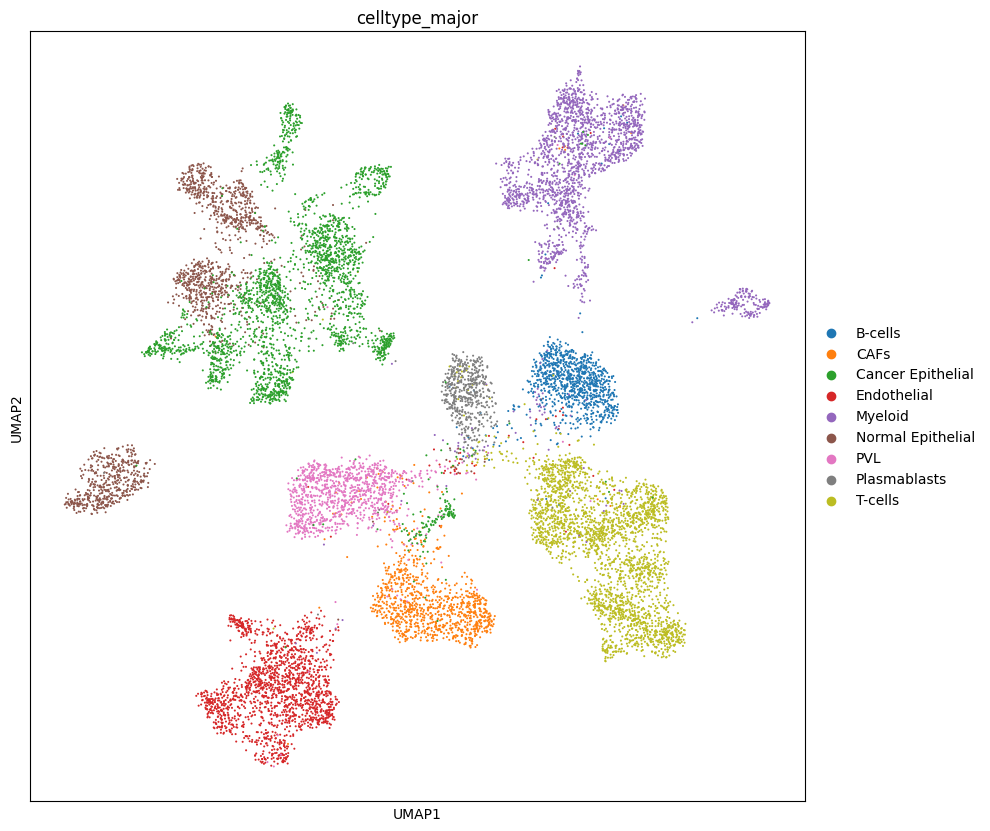

In [6]:
sc.pp.neighbors(xe_atlas)
sc.tl.umap(xe_atlas)
sc.pl.umap(xe_atlas, color='celltype_major')

Now look at the Xenium dataset, clearly not as clear! Aha! Why?! We are gonna get to the bottom of this, stay tuned...

         Falling back to preprocessing with `sc.pp.pca` and default params.


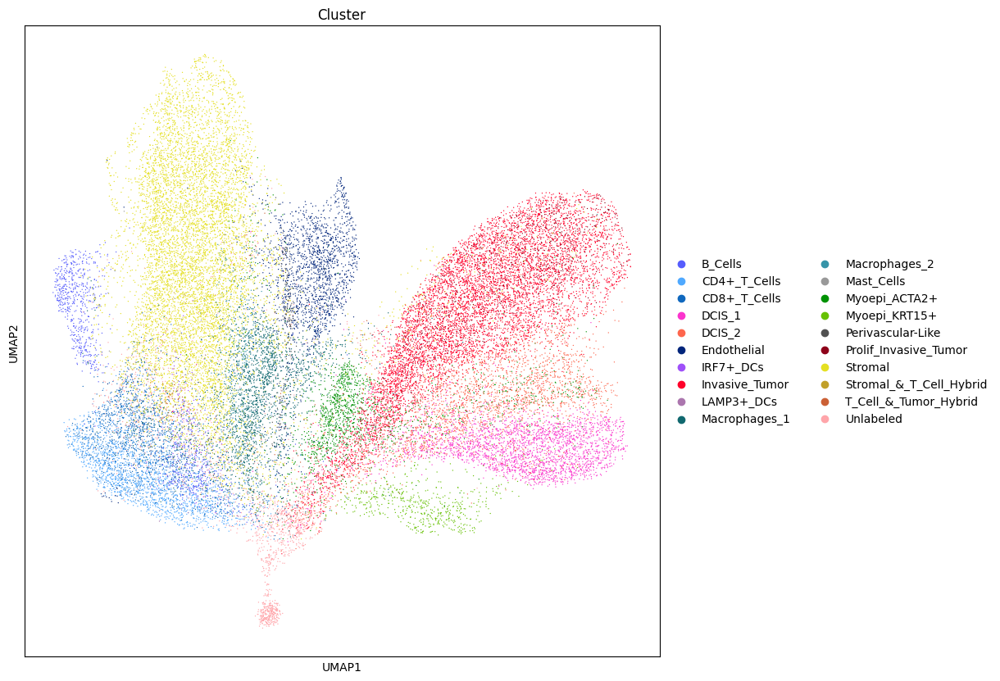

In [ ]:
sc.pp.neighbors(xe_rep1)
sc.tl.umap(xe_rep1)
sc.pl.umap(xe_rep1, color='Cluster')

To be complete, let's appreciate the beauty of the spatial organization of the cells in this entity.

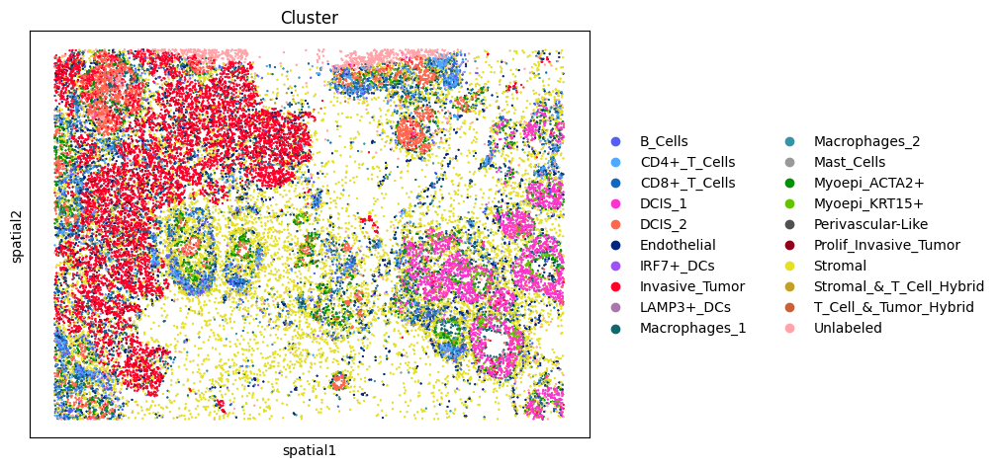

In [ ]:
sq.pl.spatial_scatter(
    xe_rep1,
    library_id="spatial",
    shape=None,
    color=[
        "Cluster",
    ],
    wspace=0.4,
    size=1
)



## Preprocessing (as in scRNAseq!)
* Quality control
* Filtering
* Normalizaiton

### Quality control and Filtering

Let's do it how we leaned to do it for scRNAseq. Counts, variation, etc. But let's also spice it up by some additional spatial information, namely, cell area and nucleus ratio (inspired by [this](https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_xenium.html)).




In [ ]:
sc.pp.calculate_qc_metrics(xe_rep1, percent_top=(10, 20, 50, 150), inplace=True)

In [ ]:
cprobes = (
    xe_rep1.obs["control_probe_counts"].sum() / xe_rep1.obs["total_counts"].sum() * 100
)
cwords = (
    xe_rep1.obs["control_codeword_counts"].sum() / xe_rep1.obs["total_counts"].sum() * 100
)

<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

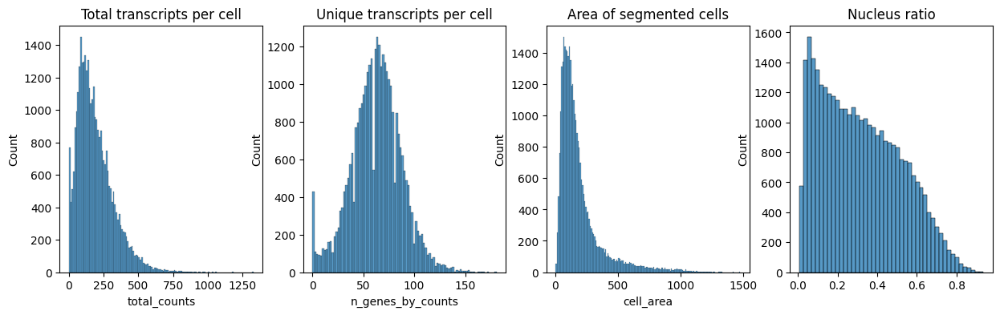

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    xe_rep1.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    xe_rep1.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    xe_rep1.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    xe_rep1.obs["nucleus_area"] / xe_rep1.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

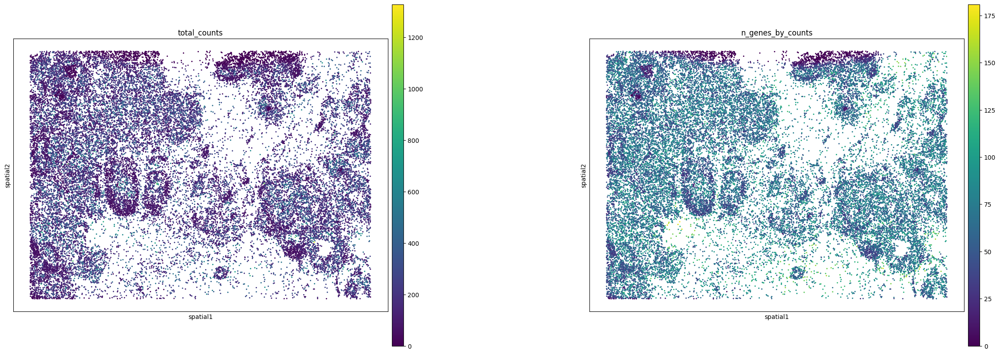

In [ ]:
sq.pl.spatial_scatter(
    xe_rep1,
    library_id="spatial",
    shape=None,
    color=[
        "total_counts",
        "n_genes_by_counts"
    ],
    wspace=0.4,
)

Let's get read of some trash; low quality genes and cells.

**Q:** What are the disadvantages of removing too many cells/genes?!

In [ ]:
sc.pp.filter_cells(xe_rep1, min_counts=50)
sc.pp.filter_genes(xe_rep1, min_cells=5)

### Normalization and dimension reduction
Everything exactly like scRNAseq.

In [ ]:
xe_rep1.layers["counts"] = xe_rep1.X.copy() # Q: why do we copy?
sc.pp.normalize_total(xe_rep1, inplace=True)
sc.pp.log1p(xe_rep1)
sc.pp.pca(xe_rep1) # play with number of PCs
sc.pp.neighbors(xe_rep1) # play with number of neighbors
sc.tl.umap(xe_rep1)
sc.tl.leiden(xe_rep1) # play with resolution
sc.pl.umap(xe_rep1)

Q: How did the UMAP changed after the preprocessing? Was it even worth it?!

## Cell type annotation (as in scRNAseq!)

We show 2 approaches for cell type annotation: (1) Reference-based (label transfer), (2) Marker-based.

### Label transfer from a reference

We [transfer the cell type labels](https://satijalab.org/seurat/articles/integration_mapping), using a quite easy mathod, [ingest](https://scanpy.readthedocs.io/en/latest/generated/scanpy.tl.ingest.html) out of the box from scanpy, from the external scRNAseq breast cancer dataset to Xenium.

**Q:** What type of integration is this?


In [ ]:
sc.pp.neighbors(xe_atlas)
sc.tl.pca(xe_atlas)
sc.tl.umap(xe_atlas)
xe_rep1 = xe_rep1[:, xe_atlas.var_names]
sc.tl.ingest(xe_rep1, xe_atlas, obs='celltype_major')

In [ ]:
import warnings
warnings.filterwarnings("ignore")

Let's now compare the initial cell type maps with the new ones, let's also look at the leiden clusters.

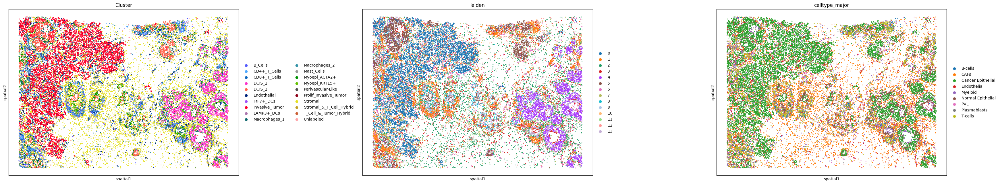

In [ ]:
sq.pl.spatial_scatter(
    xe_rep1,
    library_id="spatial",
    shape=None,
    color=[
        "Cluster",
        "leiden",
        "celltype_major"
    ],
    wspace=0.4,
)

One can compare how coherent are the two annotations by looking at the confusion matrix.

<Axes: xlabel='celltype_major', ylabel='Cluster'>

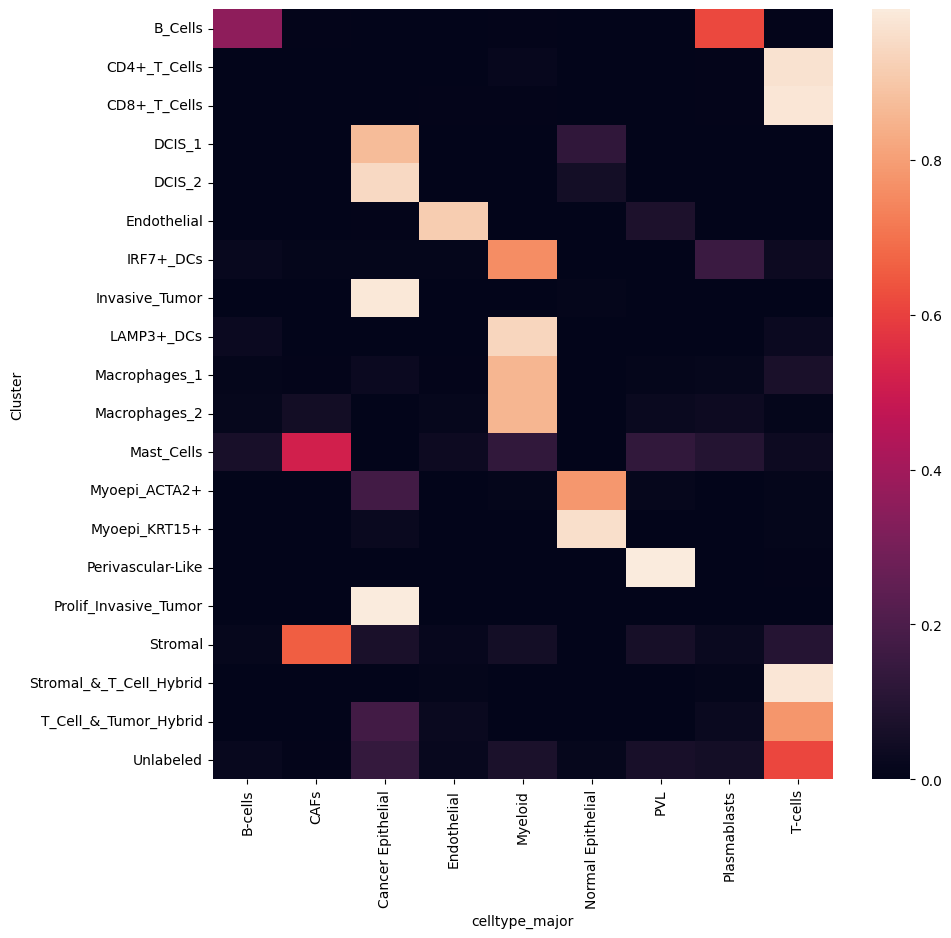

In [ ]:
cmtx = sc.metrics.confusion_matrix("Cluster", "celltype_major", xe_rep1.obs)
sns.heatmap(cmtx)

### Based on marker expression
Now let's map cell types based on Markers. The workflow is the following:

1. Cluster cells.
2. Find differentially expressed genes (DEGs).
3. Match the DEGs with known Markers.

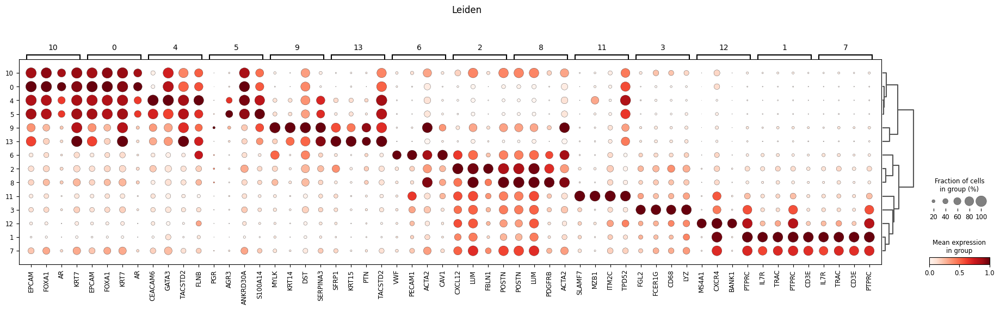

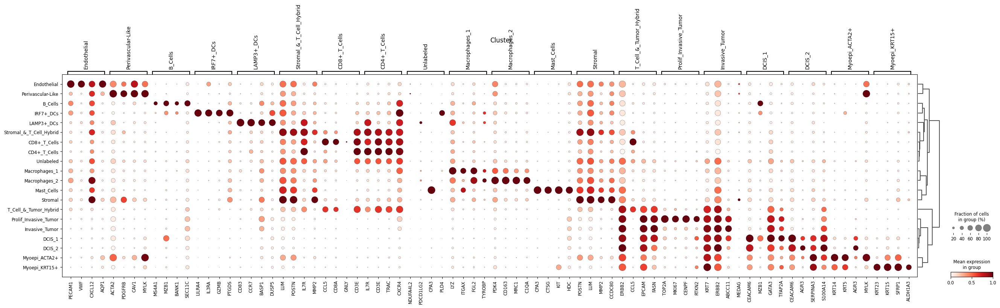

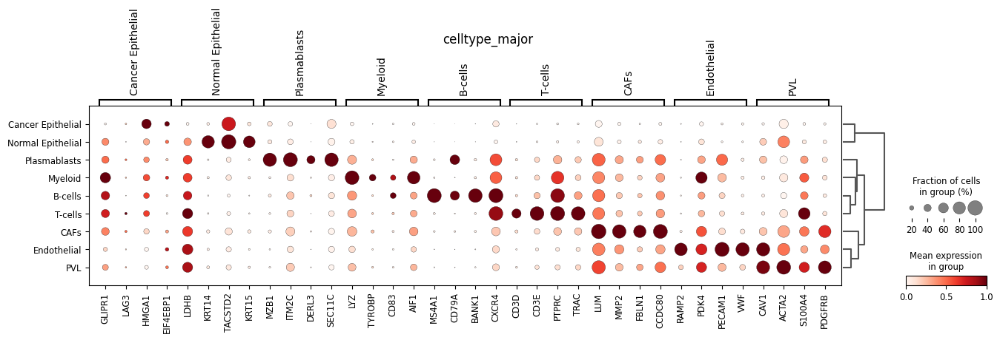

In [ ]:
sc.tl.rank_genes_groups(xe_rep1, 'leiden', method='logreg',max_iter=100)
sc.pl.rank_genes_groups_dotplot(xe_rep1, n_genes=4, standard_scale='var', title='Leiden')
sc.tl.rank_genes_groups(xe_rep1, 'Cluster', method='logreg',max_iter=100)
sc.pl.rank_genes_groups_dotplot(xe_rep1, n_genes=4, standard_scale='var', title='Cluster')
sc.tl.rank_genes_groups(xe_rep1, 'celltype_major', method='logreg',max_iter=100)
sc.pl.rank_genes_groups_dotplot(xe_rep1, n_genes=4, standard_scale='var', title='celltype_major')

For the sake of completeness let's do one last dotplot on the scRNAseq dataset.

In [ ]:
sc.tl.rank_genes_groups(xe_atlas, 'celltype_major', method='logreg',max_iter=100)
sc.pl.rank_genes_groups_dotplot(xe_atlas, n_genes=4, standard_scale='var', title='celltype_major')

NameError: name 'sc' is not defined

What's different? AHA! Why?!

[Let's take a closer look at the data!](https://xenium.10xgenomics.com/?image=s3%2F10x.files%2Fxenium%2Fpreview%2Fhbreast%2Fexperiment.xenium&zoom=0.0217&target=19259.42_12511.18&z=17&off=&layers=cell~image&mi_v=true&nav=true&axes=false&feature=icon&feature_psc=6&feature_ps=circles&ii_n=H%26E%20Image&ii_p=s3%2F10x.files%2Fxenium%2Fpreview%2FXenium_FFPE_Human_Breast_Cancer_Rep1%2FXenium_FFPE_Human_Breast_Cancer_Rep1_he_image_registered.ome.tif&ii_t=AAAAAAAA8D8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADwPwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPA%2F&ii_v=true&feature_off=313_541&bin=10&d_c=Viridis&d_o=0.8&cell_bt=cell&cell_c=groups&cell_g=0&cell_o=0.5&ct_c=Viridis&ct_o=0.8&cell_v=filled)

## Bring in the Space!
So far all methods we applied to this dataset could be applied to a scRNAseq dataset. But let's bring in the spatial aspect. What comes to your mind first?!


### Neighborhood graphs
Every cell has a neighbor (or?!), but which cell type are more often neighboring each other? is there any pattern? To asses this, we first compute the neighborhood graph using squidpy's method.

In [ ]:
sq.gr.spatial_neighbors(xe_rep1, coord_type="generic", n_neighs=15)

One can then feed in this neighborhood graph to [PAGA](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.paga.html) from Scanpy and make an abstraction (summarization) of the whole neighborhood graph at the cell type level.

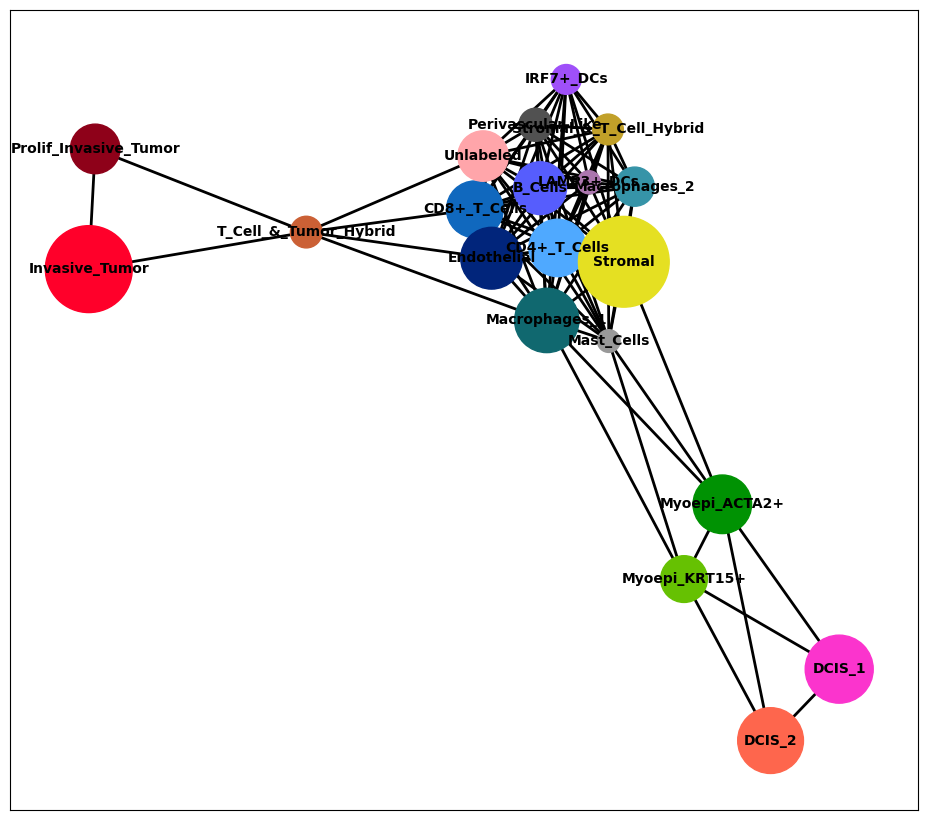

In [ ]:
sc.tl.paga(xe_rep1, groups='Cluster', neighbors_key="spatial_neighbors", copy=False)
sc.pl.paga(xe_rep1, max_edge_width=2, node_size_scale=10, threshold= .8)

### Celltype colocalization

Pretty much similar idea, but from slightly different approach one can perform [neighborhood enrichment](https://www.sc-best-practices.org/spatial/neighborhood.html) which is based on [permutation analysis](https://en.wikipedia.org/wiki/Permutation_test) (which neighborhoods are happening more often than complete random permutation of labels).

  0%|          | 0/1000 [00:00<?, ?/s]

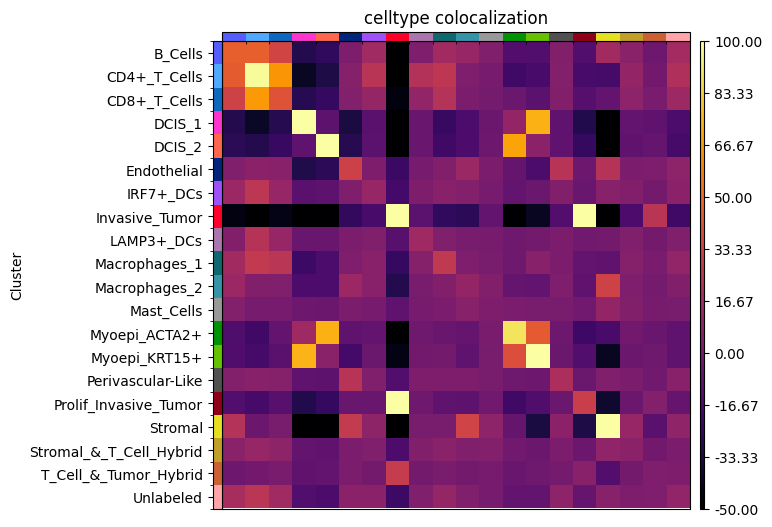

In [ ]:
sq.gr.nhood_enrichment(xe_rep1, cluster_key="Cluster")
sq.pl.nhood_enrichment(
    xe_rep1,
    cluster_key="Cluster",
    method=None,
    cmap="inferno",
    vmin=-50,
    vmax=100,
    figsize=(5, 5),
    title='celltype colocalization'
)

### Spatially informative genes

We often think about genes that are variable among cell types, but have you ever thought which genes could be variable in space? To that end, (spatial) [autocorrealtion](https://en.wikipedia.org/wiki/Autocorrelation) could be assessed. An established metric for inspecting the variability of features (here genes!) in space is Moran's I.

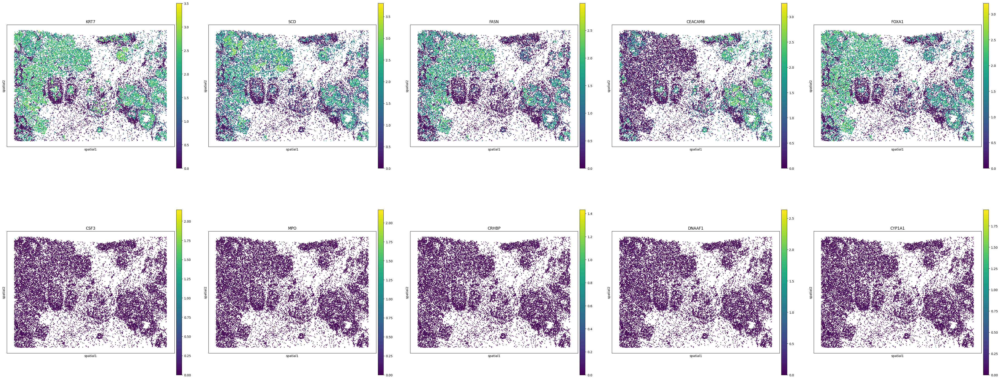

In [ ]:
sq.gr.spatial_autocorr(xe_rep1, mode="moran")
top_genes = xe_rep1.uns["moranI"].head().index
low_genes = xe_rep1.uns["moranI"].tail().index
sq.pl.spatial_scatter(
    xe_rep1, shape=None, color=top_genes.append(low_genes), size=3, ncols=5, legend_loc=None,
)

## Niche detection

Niches, niches, niches! They are nowadays everywhere in this field (ref1 [Linktext](https://www.nature.com/articles/s41467-023-36707-6), [ref2](https://www.nature.com/articles/s41587-023-01657-3), [ref3](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-023-03159-6), [ref4](https://www.biorxiv.org/content/10.1101/2024.02.21.581428v1), [ref5](https://www.embopress.org/doi/full/10.15252/msb.202311670), to name but a few)! But what are they?

I (and many others) define them as neighboring groups of cells with the same cell type composition. The following code defines such groups.

In [ ]:
from sklearn.neighbors import KDTree
import numpy as np
from scipy.sparse import lil_matrix

def knn_adjacency_matrix(data_matrix, k):
    # Construct a KDTree from the data matrix
    tree = KDTree(data_matrix)

    # Query the KDTree to find k nearest neighbors for each point
    distances, indices = tree.query(data_matrix, k+1)  # k+1 because the nearest neighbor is the point itself

    # Initialize a sparse matrix to hold the adjacency matrix
    n = len(data_matrix)
    adjacency_matrix = lil_matrix((n, n), dtype=int)

    # Populate the adjacency matrix
    for i in range(n):
        for j in indices[i, 1:]:  # Exclude the first neighbor (itself)
            adjacency_matrix[i, j] = 1
            adjacency_matrix[j, i] = 1  # Assuming undirected graph

    return adjacency_matrix

In [ ]:
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
celltype_one = ohe.fit_transform(xe_rep1.obs[['Cluster']])
celltype_dist = xe_rep1.obsp['spatial_connectivities'] @ celltype_one
celltype_dist /= celltype_dist.sum(axis=1)
xe_rep1.obsm['celltype_dist'] = celltype_dist
# sc.pp.subsample(xe_rep1, 0.1)
a = knn_adjacency_matrix(xe_rep1.obsm['celltype_dist'].toarray(), k = 100)
xe_rep1.obsp['niche_connectivities_minor'] = a.toarray()
sc.tl.leiden(xe_rep1, adjacency=xe_rep1.obsp['niche_connectivities_minor'], key_added='niche', resolution=0.2)

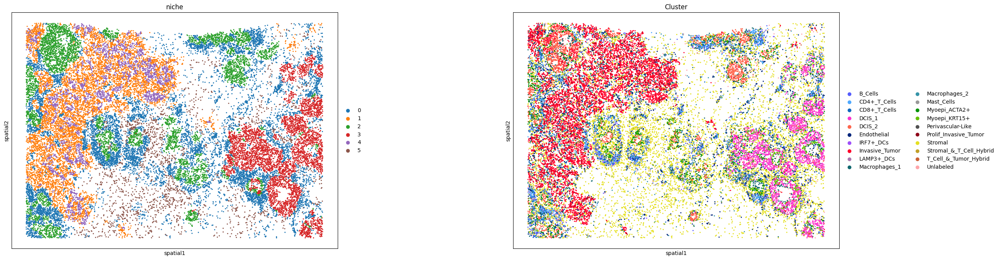

In [ ]:
# xe_rep1.uns.pop('niche_colors')
sq.pl.spatial_scatter(
    xe_rep1,
    library_id="spatial",
    shape=None,
    color=[
        "niche",
        "Cluster"
    ],
    wspace=0.4,
)

<Axes: xlabel='niche', ylabel='Cluster'>

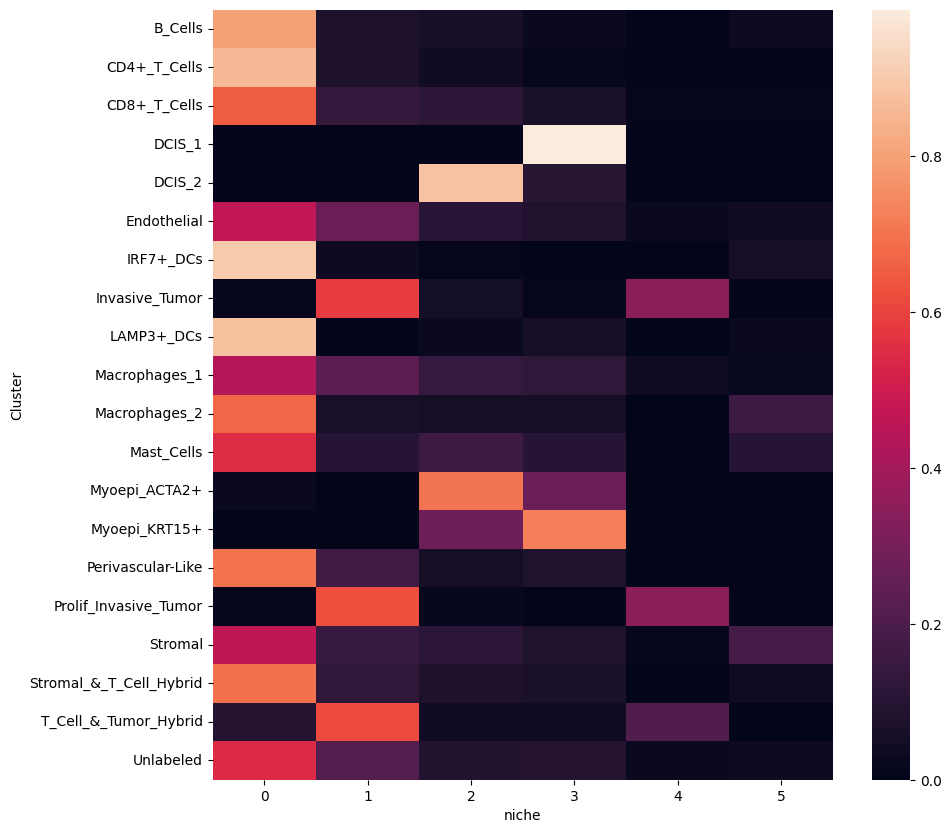

In [ ]:
cmtx = sc.metrics.confusion_matrix("Cluster", "niche", xe_rep1.obs)
sns.heatmap(cmtx)

**Exercise:** Find the niche-specific gene expression of patterns of Machrophages and Stromal cells.

**Exercise:** Try label transfer from Xenium to Visium both for cell type and niches and visualize the results.


## Extra links

* [`SpatialData`, a framework for wrangling one and multiple spatial omics datasets across samples and technologies](https://spatialdata.scverse.org/en/latest/)
* [Celltype annotation for visium using cell2location](https://cell2location.readthedocs.io/en/latest/)
* [Linear alignment of Xenium and Visium (10X general)](https://www.10xgenomics.com/support/software/xenium-explorer/latest/tutorials/xe-image-alignment)
* [Xenium paper analysis; aligment and computation](https://github.com/10XGenomics/janesick_nature_comms_2023_companion)
* [None-linear alignment of Xenium and Visium (STalign)](https://jef.works/blog/2023/12/27/alignment-of-spatial-transcriptomics-data-using-STalign/)
* [Xenium Cell Segmentation; best practices](https://www.biorxiv.org/content/10.1101/2023.02.13.528102v1)